**EN3160 Assignment 01:** Intensity Transformations and Neighborhood Filtering

- Name: M.M.H.H.B Gallella
- Index No.: 210174X 
- Submission Date: 1st October 2024 
- GitHub: https://github.com/HasithaGallella
- Assignment Codes on: Google Colab

# Question 1 – Implementing an intensity transformation on Emma Watson

In [ ]:
! dir

 Volume in drive G is Google Drive
 Volume Serial Number is 1983-1116

 Directory of g:\.shortcut-targets-by-id\11QLdIc_DFdPQFL7gIU2aCq0BACL5nAx7\Machine Learning\Image Processing\Assignments\Assignment 01

30/09/2024  04:39 pm    <DIR>          .
30/09/2024  03:44 pm    <DIR>          ..
30/09/2024  03:32 pm         1,434,506 en3160_assignment_01.pdf
30/09/2024  03:43 pm    <DIR>          a1images
30/09/2024  04:39 pm           718,203 EN3160_210174X_A01.ipynb
30/09/2024  04:25 pm             1,013 Intensity.py
               3 File(s)      2,153,722 bytes
               3 Dir(s)  10,091,139,072 bytes free


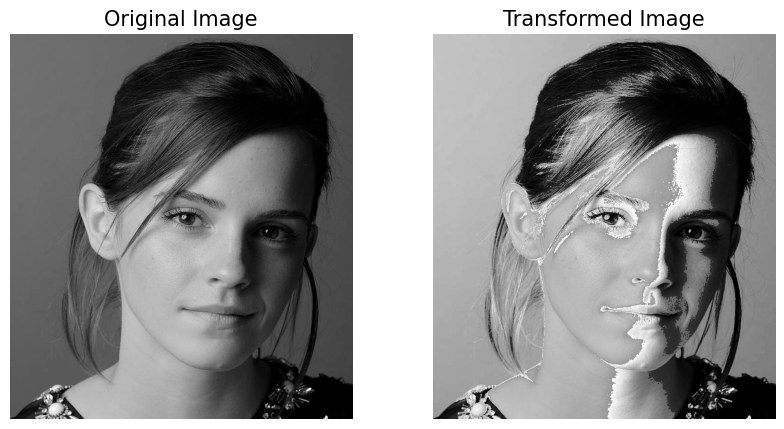

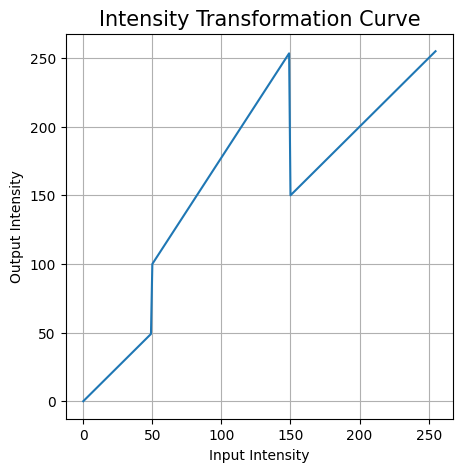

In [40]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('./a1images/emma.jpg', cv2.IMREAD_GRAYSCALE) # PC
# image = cv2.imread('./a1images/emma.jpg', cv2.IMREAD_GRAYSCALE) # Colab

# Define the intensity transformation function
def intensity_transformation(input_intensity):
    # Assuming a piecewise linear function for intensity transformation
    if input_intensity < 50:
        return input_intensity
    elif input_intensity < 150:
        return (1.55*input_intensity + 22.5)
    else:
        return input_intensity

# Vectorize the function to apply to the image
vectorized_transformation = np.vectorize(intensity_transformation)

# Apply the transformation to the image
transformed_image = vectorized_transformation(image).astype(np.uint8)

# Plot the original and transformed images
plt.figure(figsize=(10, 5))

# Display the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

# Display the transformed image
plt.subplot(1, 2, 2)
plt.title('Transformed Image')
plt.imshow(transformed_image, cmap='gray')
plt.axis('off')

plt.show()

# Plot the intensity transformation curve
input_intensity = np.arange(0, 256)
output_intensity = np.array([intensity_transformation(x) for x in input_intensity])

plt.figure(figsize=(5, 5))
plt.plot(input_intensity, output_intensity, label="Intensity Transformation")
plt.title('Intensity Transformation Curve')
plt.xlabel('Input Intensity')
plt.ylabel('Output Intensity')
plt.grid(True)
plt.show()

**Discussion:** Pixel values in the [0,50] and [150,255] 
ranges are mapped similarly, resulting in little change in 
her hair color, which falls in the lower range. Mid-range 
values (50-150) are exaggerated, causing white patches 
on the right side of the face, while the left side, being in 
the 150+ range, shows minimal change.

# Question 2 – Intensity transformation on brain proton density image 

In [42]:
import cv2

# Function to handle mouse click events
def get_pixel_intensity(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:  # If the left mouse button is clicked
        pixel_value = image[y, x]  # Get pixel value at the clicked position (x, y)
        print(f'Pixel location: ({x}, {y})')
        print(f'Pixel intensity value: {pixel_value}')
        # If the image is in color, it will display intensity for each channel

# Load the image (modify 'image_path' with the actual path of your image)
image = cv2.imread('./a1images/brain_proton_density_slice.png', cv2.IMREAD_GRAYSCALE)

# Create a window and bind the mouse callback function to this window
cv2.namedWindow('Image')
cv2.setMouseCallback('Image', get_pixel_intensity)

White matter intensity

In [43]:
while True:
    cv2.imshow('Image', image)  # Display the image

    # Exit the loop when the 'q' key is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Destroy all windows when the loop ends
cv2.destroyAllWindows()

Pixel location: (60, 118)
Pixel intensity value: 170
Pixel location: (58, 108)
Pixel intensity value: 166
Pixel location: (58, 105)
Pixel intensity value: 155
Pixel location: (58, 101)
Pixel intensity value: 170
Pixel location: (58, 94)
Pixel intensity value: 172
Pixel location: (58, 89)
Pixel intensity value: 154
Pixel location: (56, 85)
Pixel intensity value: 163
Pixel location: (56, 82)
Pixel intensity value: 157
Pixel location: (60, 72)
Pixel intensity value: 162
Pixel location: (118, 129)
Pixel intensity value: 178
Pixel location: (114, 146)
Pixel intensity value: 163
Pixel location: (73, 145)
Pixel intensity value: 168
Pixel location: (65, 135)
Pixel intensity value: 165


KeyboardInterrupt: 

Gray matter intensity

In [44]:
while True:
    cv2.imshow('Image', image)  # Display the image

    # Exit the loop when the 'q' key is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Destroy all windows when the loop ends
cv2.destroyAllWindows()

Pixel location: (158, 90)
Pixel intensity value: 199
Pixel location: (153, 82)
Pixel intensity value: 177
Pixel location: (152, 75)
Pixel intensity value: 212
Pixel location: (63, 174)
Pixel intensity value: 194
Pixel location: (48, 156)
Pixel intensity value: 189
Pixel location: (36, 129)
Pixel intensity value: 187
Pixel location: (34, 75)
Pixel intensity value: 203
Pixel location: (41, 88)
Pixel intensity value: 194
Pixel location: (41, 89)
Pixel intensity value: 188
Pixel location: (35, 85)
Pixel intensity value: 191
Pixel location: (133, 169)
Pixel intensity value: 201
Pixel location: (133, 166)
Pixel intensity value: 218
Pixel location: (132, 162)
Pixel intensity value: 203
Pixel location: (128, 159)
Pixel intensity value: 197


KeyboardInterrupt: 

Test Intensity transformation 1:

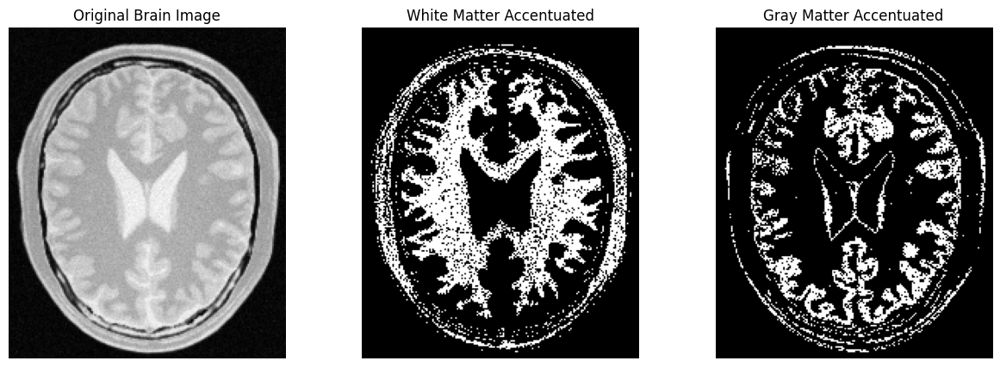

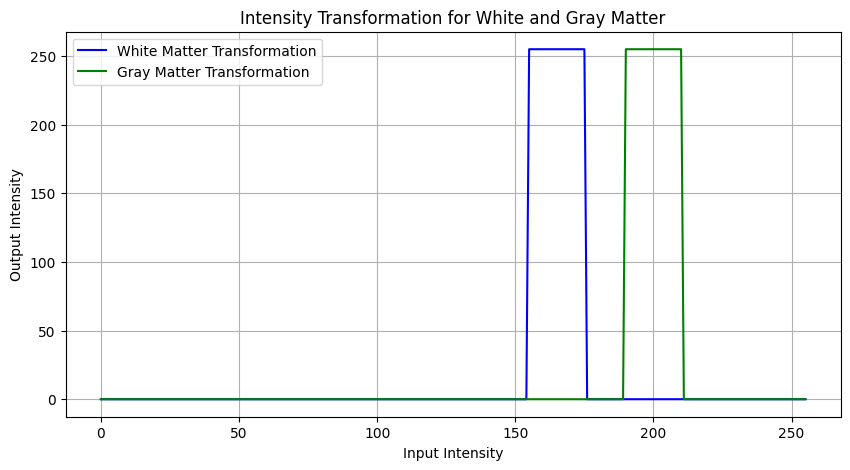

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the brain image (Fig. 2)
brain_image = cv2.imread('./a1images/brain_proton_density_slice.png', cv2.IMREAD_GRAYSCALE)

# Define intensity transformation functions for white matter and gray matter
def accentuate_white_matter(intensity):
    # Custom function to enhance white matter
    if intensity < 150:
        return 0
    elif intensity >= 155 and intensity <= 175:
        return 255
    else:
        return 0

def accentuate_gray_matter(intensity):
    # Custom function to enhance gray matter
    if intensity < 150:
        return 0
    elif intensity >= 190 and intensity <= 210:
        return 255
    else:
        return 0

# Vectorize the functions
accentuate_white_matter_vec = np.vectorize(accentuate_white_matter)
accentuate_gray_matter_vec = np.vectorize(accentuate_gray_matter)

# Apply transformations to the brain image
white_matter_image = accentuate_white_matter_vec(brain_image).astype(np.uint8)
gray_matter_image = accentuate_gray_matter_vec(brain_image).astype(np.uint8)

# Display the original and transformed images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.title('Original Brain Image')
plt.imshow(brain_image, cmap='gray')
plt.axis('off')

# White matter accentuated
plt.subplot(1, 3, 2)
plt.title('White Matter Accentuated')
plt.imshow(white_matter_image, cmap='gray')
plt.axis('off')

# Gray matter accentuated
plt.subplot(1, 3, 3)
plt.title('Gray Matter Accentuated')
plt.imshow(gray_matter_image, cmap='gray')
plt.axis('off')

plt.show()

# Plot intensity transformations for both white and gray matter
intensity_values = np.arange(0, 256)
white_matter_transformed = np.array([accentuate_white_matter(x) for x in intensity_values])
gray_matter_transformed = np.array([accentuate_gray_matter(x) for x in intensity_values])

# Plot the transformation curves
plt.figure(figsize=(10, 5))

plt.plot(intensity_values, white_matter_transformed, label='White Matter Transformation', color='blue')
plt.plot(intensity_values, gray_matter_transformed, label='Gray Matter Transformation', color='green')

plt.title('Intensity Transformation for White and Gray Matter')
plt.xlabel('Input Intensity')
plt.ylabel('Output Intensity')
plt.grid(True)
plt.legend()
plt.show()


Test Intensity transformation 2:

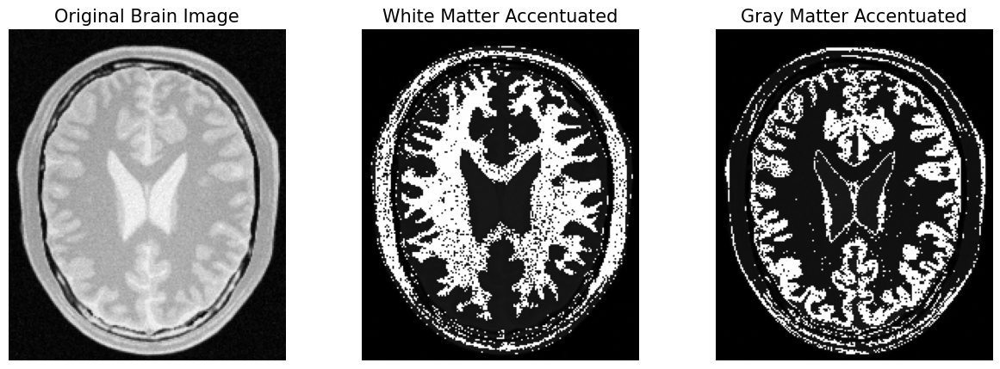

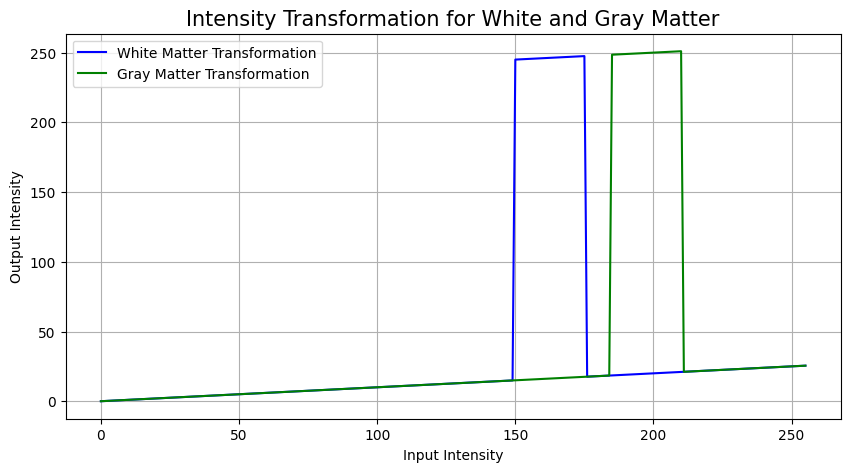

In [46]:
# Read the brain image (Fig. 2)
brain_image = cv2.imread('./a1images/brain_proton_density_slice.png', cv2.IMREAD_GRAYSCALE)

# Define intensity transformation functions for white matter and gray matter
def accentuate_white_matter(intensity):
    # Custom function to enhance white matter
    if intensity < 150:
        return intensity*0.1
    elif intensity >= 150 and intensity <= 175:
        return (255 - 25 + intensity*0.1)
    else:
        return intensity*0.1

def accentuate_gray_matter(intensity):
    # Custom function to enhance gray matter
    if intensity < 150:
        return intensity*0.1
    elif intensity >= 185 and intensity <= 210:
        return (255 - 25 + intensity*0.1)
    else:
        return intensity*0.1

# Vectorize the functions
accentuate_white_matter_vec = np.vectorize(accentuate_white_matter)
accentuate_gray_matter_vec = np.vectorize(accentuate_gray_matter)

# Apply transformations to the brain image
white_matter_image = accentuate_white_matter_vec(brain_image).astype(np.uint8)
gray_matter_image = accentuate_gray_matter_vec(brain_image).astype(np.uint8)

# Display the original and transformed images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.title('Original Brain Image')
plt.imshow(brain_image, cmap='gray')
plt.axis('off')

# White matter accentuated
plt.subplot(1, 3, 2)
plt.title('White Matter Accentuated')
plt.imshow(white_matter_image, cmap='gray')
plt.axis('off')

# Gray matter accentuated
plt.subplot(1, 3, 3)
plt.title('Gray Matter Accentuated')
plt.imshow(gray_matter_image, cmap='gray')
plt.axis('off')

plt.show()

# Plot intensity transformations for both white and gray matter
intensity_values = np.arange(0, 256)
white_matter_transformed = np.array([accentuate_white_matter(x) for x in intensity_values])
gray_matter_transformed = np.array([accentuate_gray_matter(x) for x in intensity_values])

# Plot the transformation curves
plt.figure(figsize=(10, 5))

plt.plot(intensity_values, white_matter_transformed, label='White Matter Transformation', color='blue')
plt.plot(intensity_values, gray_matter_transformed, label='Gray Matter Transformation', color='green')

plt.title('Intensity Transformation for White and Gray Matter')
plt.xlabel('Input Intensity')
plt.ylabel('Output Intensity')
plt.grid(True)
plt.legend()
plt.show()


**Discussion:** The Intensities measured for
white matter and gray matter using my 
special function get_pixel_intensity(event, 
x, y, flags, param). Then next 2 functions 
accentuate white matter; range 150 to 175
and accentuate gray matter; range 185 to 
210 intensities will be exaggerated as we did 
in the Question 1. This will allow us to view 
clearly the regions of white and gray matter
in the brain.

# Question 3 – Gamma correction to the L plane in the L∗a∗b∗ color space

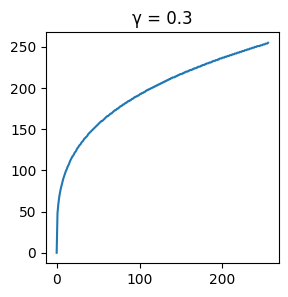

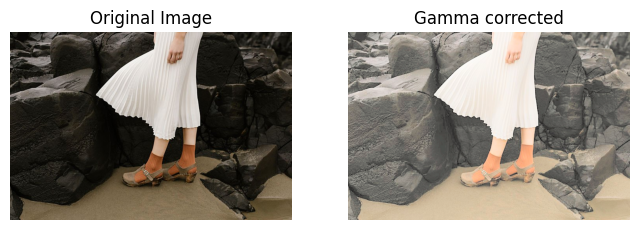

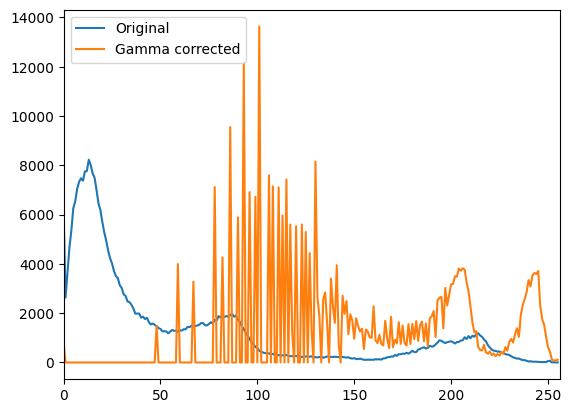

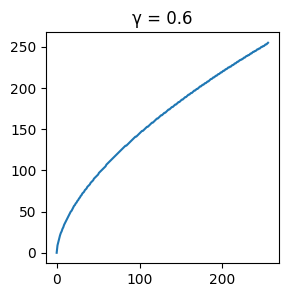

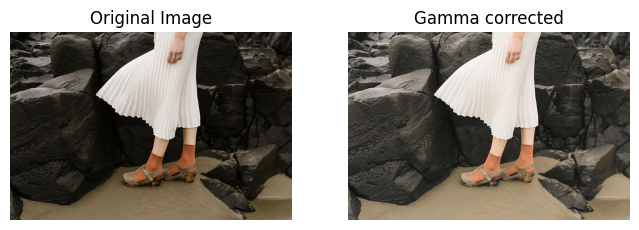

...

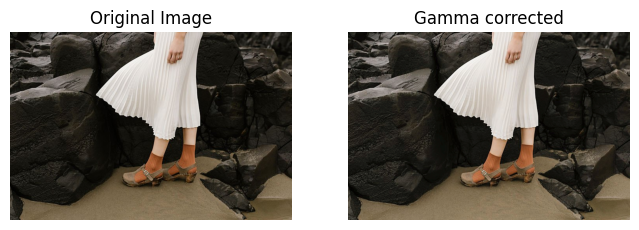

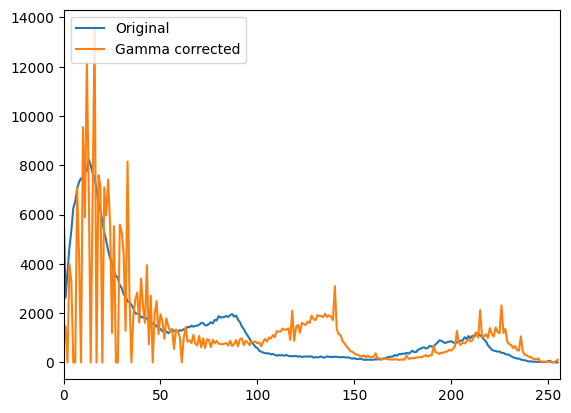

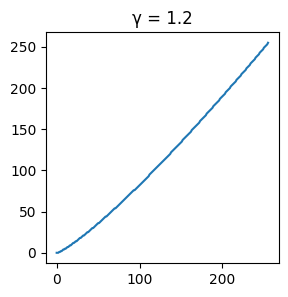

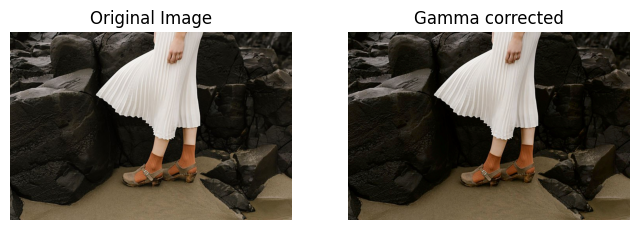

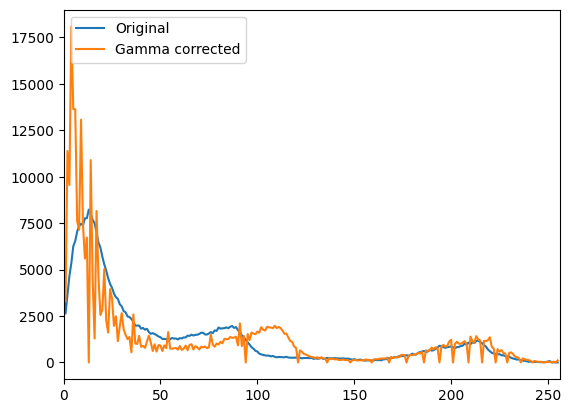

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
img = cv.imread("./a1images/highlights_and_shadows.jpg")

# Convert the image to the LAB color space and split into L (luminance), a, and b channels.
# LAB color space separates brightness (L) from color components (a and b).
L, a, b = cv.split(cv.cvtColor(img, cv.COLOR_BGR2LAB))

# Define different gamma values in a list
gamma = [0.3, 0.6, 0.9, 1.2]  # These values control how light or dark the image will become

# Loop over each gamma value to apply gamma correction
for i in gamma:
    # Create a gamma correction lookup table:
    # We calculate the transformed intensity values based on the formula: (p / 255) ** i * 255,
    # where p is the pixel intensity, and i is the gamma value.
    t = np.array([(p / 255) ** i * 255 for p in range(0, 256)]).astype(np.uint8)

    # Apply the gamma correction using cv.LUT (Lookup Table) to the L (luminance) channel.
    # The LUT function maps the original intensity values to new gamma-corrected values.
    g = cv.LUT(L, t)

    # Merge the gamma-corrected L channel with the original a and b channels to form a corrected image.
    corrected_img = cv.merge([g, a, b])

    # Calculate the histogram of the original image (using the L channel of the BGR image).
    hist1 = cv.calcHist([img], [0], None, [256], [0, 256])

    # Calculate the histogram of the gamma-corrected image (L channel of the corrected LAB image).
    hist2 = cv.calcHist([corrected_img], [0], None, [256], [0, 256])

    # Plot the gamma transformation curve (lookup table) for each gamma value.
    fig, ax = plt.subplots(figsize=(3, 3))
    ax.set_title("\u03B3 = " + str(i))  # \u03B3 is the Unicode symbol for gamma
    ax.plot(t)  # Plot the lookup table (input vs output intensities)

    # Create subplots to display the original and gamma-corrected images side by side
    fig, ax = plt.subplots(1, 2, figsize=(8, 8))

    # Display the original image in RGB format (converted from BGR to RGB for correct color rendering)
    ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax[0].set_title('Original Image')
    ax[0].axis('off')  # Hide axis

    # Display the gamma-corrected image (converted back from LAB to RGB for visualization)
    ax[1].imshow(cv.cvtColor(corrected_img, cv.COLOR_LAB2RGB))
    ax[1].set_title('Gamma corrected')
    ax[1].axis('off')  # Hide axis

    # Show the image plots
    plt.show()

    # Plot the histograms of the original and gamma-corrected images.
    plt.plot(hist1)  # Plot histogram of the original image (L channel)
    plt.xlim([0, 256])  # Limit the x-axis to the intensity range (0-255)

    plt.plot(hist2)  # Plot histogram of the gamma-corrected image (L channel)
    plt.xlim([0, 256])  # Limit the x-axis to the intensity range (0-255)

    # Add a legend to differentiate between the original and gamma-corrected histograms
    plt.legend(('Original', 'Gamma corrected'), loc='upper left')

    # Show the histogram plots
    plt.show()


For gamma = 0.6 : Histograms for all 3 color planes before and after applying the correction

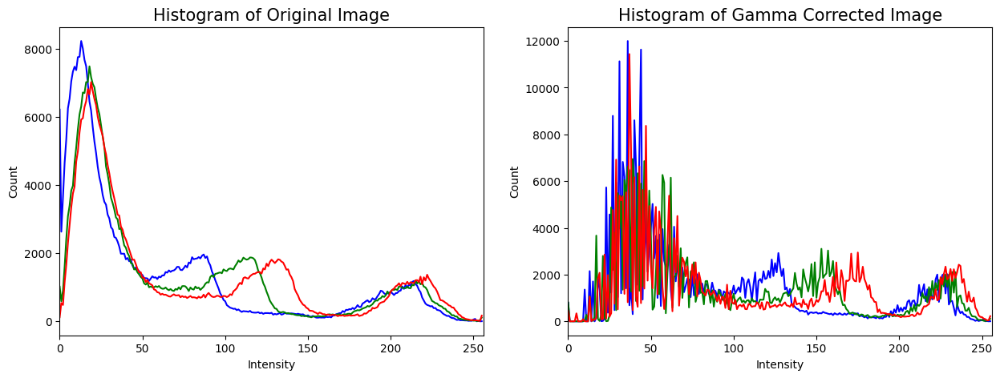

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Set the gamma value for gamma correction.
# A gamma < 1 will lighten the image, while a gamma > 1 will darken it.
gamma = 0.6

# Create a gamma transformation lookup table.
# For each intensity value `i` (ranging from 0 to 255), apply the gamma correction formula:
# new_value = (i / 255.0) ** gamma * 255.0.
# This creates a mapping for every intensity from the original to the gamma-corrected value.
gamma_transform = np.array([(i / 255.0) ** gamma * 255.0 for i in np.arange(0, 256)]).astype('uint8')

# Read the image in color mode (BGR format).
img3 = cv.imread("./a1images/highlights_and_shadows.jpg", cv.IMREAD_COLOR)

# Convert the BGR image to LAB color space.
# The LAB color space separates luminance (L) from color (a and b channels), which makes it ideal
# for brightness adjustments without affecting color balance.
img3_lab = cv.cvtColor(img3, cv.COLOR_BGR2LAB)

# Apply gamma correction only to the L plane (brightness channel) in the LAB color space.
# The L channel represents brightness, and we use the gamma transform lookup table to adjust it.
img3_lab[:, :, 0] = gamma_transform[img3_lab[:, :, 0]]

# Define a function to compute and plot histograms for each of the 3 color planes (B, G, R).
def histBGR(img):
    # Define colors for each channel: blue, green, and red
    colors = ('b', 'g', 'r')

    # Loop over each channel (0: blue, 1: green, 2: red)
    for i, color in enumerate(colors):
        # Calculate the histogram for the current channel
        hist = cv.calcHist([img], [i], None, [256], [0, 256])
        # Plot the histogram using the respective color
        plt.plot(hist, color=color)

    # Set the x-axis limits (intensity range: 0-255)
    plt.xlim([0, 256])

# Create a figure for displaying the histograms of the original and gamma-corrected images.
plt.figure(figsize=(15, 5))  # Set the size of the figure (15x5 inches)
plt.rc('axes', titlesize=15)  # Set the size of the titles in the subplots

# First subplot: Histogram of the original image
plt.subplot(121)  # First subplot (1 row, 2 columns, first plot)
histBGR(img3)  # Compute and plot the histogram for the original image
plt.title("Histogram of Original Image")
plt.xlabel("Intensity")  # Label for the x-axis (pixel intensity)
plt.ylabel("Count")  # Label for the y-axis (pixel count)

# Second subplot: Histogram of the gamma-corrected image
plt.subplot(122)  # Second subplot (1 row, 2 columns, second plot)
histBGR(cv.cvtColor(img3_lab, cv.COLOR_LAB2BGR))  # Convert LAB back to BGR for plotting
plt.title("Histogram of Gamma Corrected Image")
plt.xlabel("Intensity")  # Label for the x-axis (pixel intensity)
plt.ylabel("Count")  # Label for the y-axis (pixel count)

# Display the plots
plt.show()

**Discussion:** Gamma correction affects the brightness and contrast of an image depending on the value of gamma. When 
the gamma value is set to 1, the gamma correction curve is linear, meaning the image remains unchanged and the 
histogram retains its original distribution. When the gamma value is less than 1 (for example, 0.2), gamma compression 
occurs, which darkens the image and shifts the histogram towards the left, concentrating more pixel values in the darker 
regions. Conversely, when the gamma value is greater than 1 (for example, 2.0), gamma expansion occurs, brightening 
the image and shifting the histogram to the right, thereby increasing the concentration of pixel values in the lighter 
regions. After testing various gamma values, it was found that a gamma value of 0.6 provided the best result for this 
image, enhancing the contrast while maintaining a natural look.

# Question 4 – Intensity transformation to the saturation plane for increase the vibrance

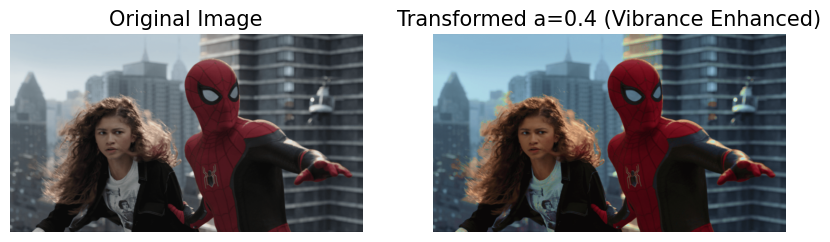

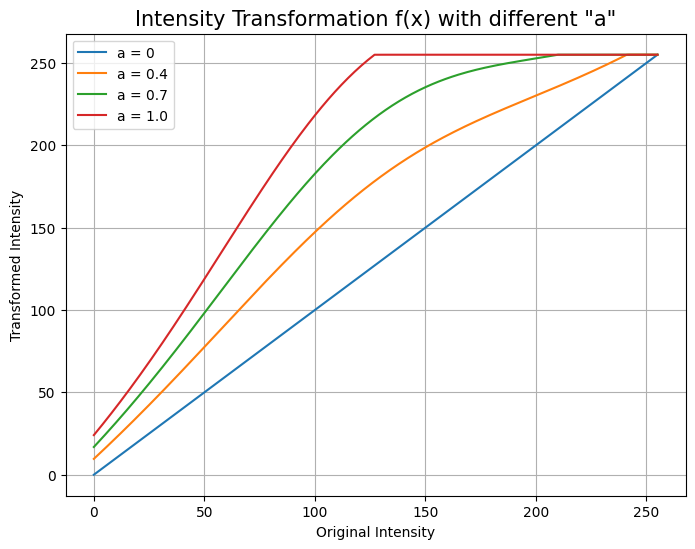

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Step (a): Split the image shown in Fig. 4 into hue, saturation, and value planes.

image_bgr = cv.imread('./a1images/spider.png', cv.IMREAD_COLOR) # Load the image in BGR color space
image_hsv = cv.cvtColor(image_bgr, cv.COLOR_BGR2HSV) # Convert the BGR image to HSV color space
# Split the HSV image into three channels: hue (H), saturation (S), and value (V)
h, saturation_plane, v = cv.split(image_hsv)

# Step (b): Apply the intensity transformation to the saturation plane.
# Define the intensity transformation function according to the formula provided
def intensity_transform(x, a, sigma=70):
    # Transformation function: f(x) = x + a * 128 * exp(-(x - 128)^2 / (2 * sigma^2))
    f_x = np.clip(x + a * 128 * np.exp(-(x - 128)**2 / (2 * sigma**2)), 0, 255)
    return f_x

# Apply the intensity transformation to the saturation plane (with 'a' initially set to 0.4)
transforemed_saturation_plane = intensity_transform(saturation_plane, a=0.4)

# Step (c): Adjust 'a' to get a visually pleasing output. Report the value of 'a'.
# Here we initially set 'a' to 0.4, but the value can be adjusted to achieve the desired vibrance.

# Step (d): Recombine the three planes (hue, modified saturation, and value).
# Make a copy of the original HSV image to store the modified saturation plane
image_copy = image_hsv.copy()

# Replace the original saturation plane with the transformed saturation plane
image_copy[:, :, 1] = transforemed_saturation_plane

# Convert the modified HSV image back to BGR color space
# This gives us the final image with enhanced vibrance
transformed_image = cv.cvtColor(image_copy, cv.COLOR_HSV2RGB)

# Step (e): Display the original image, vibrance-enhanced image, and the intensity transformation.
# Convert the original HSV image back to RGB for display
original_image = cv.cvtColor(image_hsv, cv.COLOR_HSV2RGB)

# Display the original and transformed images side by side
f, axarr = plt.subplots(1, 2, figsize=(10, 5))
axarr[0].imshow(original_image)
axarr[0].set_title('Original Image')
axarr[0].axis('off')

axarr[1].imshow(transformed_image)
axarr[1].set_title('Transformed a=0.4 (Vibrance Enhanced)')
axarr[1].axis('off')

plt.show()

# Plot the intensity transformation function for different values of 'a'
intensity_values = np.arange(256)  # Array of intensity values from 0 to 255
a_values = [0, 0.4, 0.7, 1.0]  # Different values of 'a' for comparison

plt.figure(figsize=(8, 6))

# Loop through different values of 'a' and plot the transformation function
for a in a_values:
    transformation_values = intensity_transform(intensity_values, a)
    plt.plot(intensity_values, transformation_values, label=f'a = {a}')

# Add labels and a title to the plot
plt.title('Intensity Transformation f(x) with different "a"')
plt.xlabel('Original Intensity')
plt.ylabel('Transformed Intensity')
plt.legend()  # Add a legend to indicate different 'a' values
plt.grid(True)  # Add grid lines to the plot
plt.show()


**Discussion:** The saturation plane is modified by applying an intensity 
transformation, increasing the vibrancy of the image. Areas with low 
saturation become more vivid, enhancing color contrast. Fine-tuning the 
parameter a is essential; when a approaches 1, the image can appear overly 
vibrant. A value of a = 0.4 provided a natural vibrance level, keeping the image 
visually pleasing without oversaturation.

# Question 5 – Histogram equalization 

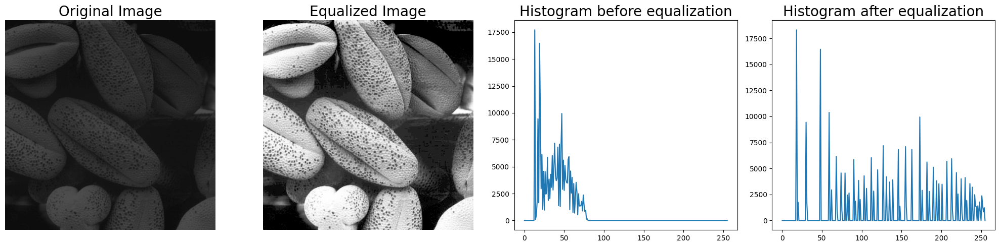

In [ ]:
import cv2 as cv  # Import OpenCV for image processing
import numpy as np  # Import NumPy for numerical operations
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Function for histogram equalization
def hist_equalize(image):
    # Calculate the total number of pixels in the image
    total = image.shape[0] * image.shape[1]  # total = number of rows * number of columns

    # Compute the histogram of the image
    hist, bins = np.histogram(image.ravel(), 256, [0, 256])  # hist gives the frequency of each pixel intensity

    # Compute the cumulative distribution function (CDF) of the histogram
    cdf = hist.cumsum()  # cdf is the cumulative sum of the histogram values

    # Normalize the CDF to map the intensity values to the range [0, 255]
    transform = (cdf * 255 / total).astype(np.uint8)  # Normalize cdf to the range [0, 255]

    # Map the original image's pixel values to the equalized values using the transform
    equalized_image = transform[image]  # Apply the transform to the original image

    return equalized_image  # Return the equalized image

# Load the input image in grayscale mode
img5 = cv.imread("./a1images/shells.tif", cv.IMREAD_GRAYSCALE)  # Read the image in grayscale

# Apply histogram equalization using the custom function
equalized_img5 = hist_equalize(img5)  # Equalize the histogram of the image

# Compute the histograms of the original and equalized images
before_hist, _ = np.histogram(img5.ravel(), 256, [0, 256])  # Histogram of the original image
after_hist, _ = np.histogram(equalized_img5.ravel(), 256, [0, 256])  # Histogram of the equalized image

# Set up the figure for displaying the results
plt.figure(figsize=(20, 5))  # Create a figure with a size of 20x5 inches

# Configure the plot's title size
plt.rc("axes", titlesize=20)  # Set the size of the subplot titles

# Display the original image
plt.subplot(141)  # First subplot in a grid of 1 row and 4 columns
plt.imshow(img5, cmap='gray', vmin=0, vmax=255)  # Display the original grayscale image
plt.title("Original Image")  # Set the title for the original image
plt.axis('off')  # Turn off axis labels and ticks

# Display the equalized image
plt.subplot(142)  # Second subplot
plt.imshow(equalized_img5, cmap='gray')  # Display the equalized grayscale image
plt.title("Equalized Image")  # Set the title for the equalized image
plt.axis('off')  # Turn off axis labels and ticks

# Display the histogram before equalization
plt.subplot(143)  # Third subplot
plt.plot(before_hist)  # Plot the histogram of the original image
plt.title("Histogram before equalization")  # Set the title for the histogram before equalization

# Display the histogram after equalization
plt.subplot(144)  # Fourth subplot
plt.plot(after_hist)  # Plot the histogram of the equalized image
plt.title("Histogram after equalization")  # Set the title for the histogram after equalization

# Adjust the layout of the subplots to avoid overlap
plt.tight_layout()  # Adjust the layout to make sure subplots fit neatly

# Show the plots
plt.show()  # Display the figure with the images and histograms


**Discussion:** This function computes the histogram and 
performs histogram equalization by 
mapping original pixel intensities to the full 
dynamic range using the cumulative 
distribution function (CDF). As a result, the 
darker regions in the image are brightened, 
providing a more balanced intensity 
distribution and enhancing image contrast.

# Question 6 – Histogram equalizing the foreground of an image

In [47]:
import cv2 as cv  
import numpy as np  
import matplotlib.pyplot as plt  

In [50]:
image = cv2.imread("./a1images/jeniffer.jpg")
image.shape

(2160, 3840, 3)

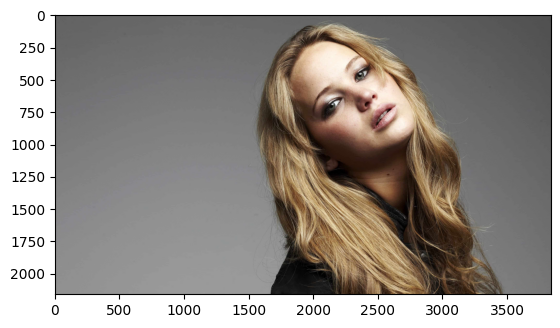

In [51]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

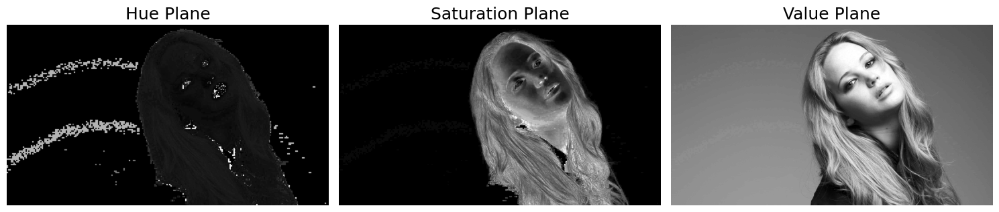

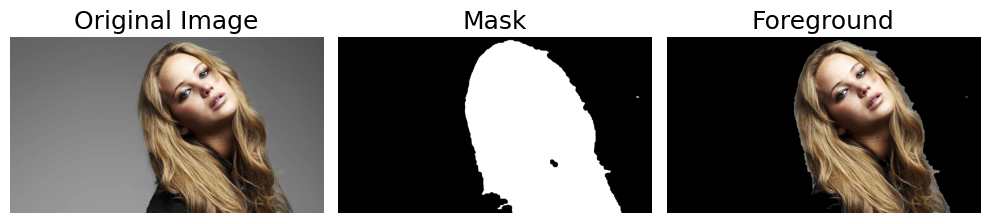

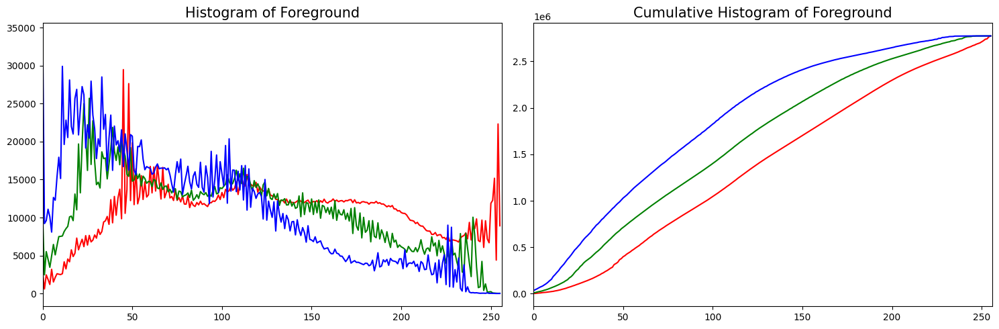

error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\core\src\arithm.cpp:230: error: (-215:Assertion failed) (mtype == CV_8U || mtype == CV_8S) && _mask.sameSize(*psrc1) in function 'cv::binary_op'


In [52]:
import cv2 as cv  # Import OpenCV for image processing
import numpy as np  # Import NumPy for numerical operations
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Load the image
image = cv.imread("./a1images/jeniffer.jpg")  # Read the image

# (a) Split the image into HSV planes
image_hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)  # Convert image to HSV color space
hue_plane = image_hsv[:, :, 0]  # Extract hue plane
saturation_plane = image_hsv[:, :, 1]  # Extract saturation plane
value_plane = image_hsv[:, :, 2]  # Extract value plane

# Display the hue, saturation, and value planes in grayscale
plt.figure(figsize=(15, 10))  # Set the figure size
plt.rc("axes", titlesize=18)  # Set the title size for subplots

plt.subplot(131)
plt.imshow(hue_plane, cmap='gray')  # Display hue plane in grayscale
plt.title("Hue Plane")
plt.axis('off')  # Turn off the axis

plt.subplot(132)
plt.imshow(saturation_plane, cmap='gray')  # Display saturation plane in grayscale
plt.title("Saturation Plane")
plt.axis('off')

plt.subplot(133)
plt.imshow(value_plane, cmap='gray')  # Display value plane in grayscale
plt.title("Value Plane")
plt.axis('off')

plt.tight_layout()  # Adjust layout
plt.show()

# (b) Threshold the saturation plane to extract the foreground mask
threshold = 12  # Define a threshold to extract the foreground
foreground_mask = (saturation_plane > threshold).astype(np.uint8) * 255  # Create a binary mask

# Morphological closing to clean up the mask
foreground_mask = cv.morphologyEx(foreground_mask, cv.MORPH_CLOSE, cv.getStructuringElement(cv.MORPH_ELLIPSE, (50, 50)))  # Clean the mask
mask_3d = np.repeat(foreground_mask[:, :, None], 3, axis=2)  # Create a 3-channel mask for RGB

# (c) Extract the foreground using cv.bitwise_and
foreground_hsv = cv.bitwise_and(image_hsv, image_hsv, mask=foreground_mask)  # Extract foreground in HSV
foreground_rgb = cv.cvtColor(foreground_hsv, cv.COLOR_HSV2RGB)  # Convert the foreground to RGB for display

# Display original image, mask, and foreground
plt.figure(figsize=(10, 10))  # Set the figure size

plt.subplot(131)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))  # Display the original image in RGB
plt.title('Original Image')
plt.axis('off')  # Turn off axis

plt.subplot(132)
plt.imshow(foreground_mask, cmap='gray')  # Display the binary mask
plt.title('Mask')
plt.axis('off')

plt.subplot(133)
plt.imshow(foreground_rgb)  # Display the extracted foreground
plt.title('Foreground')
plt.axis('off')

plt.tight_layout()  # Adjust layout
plt.show()

# (d) Compute histogram of the foreground and cumulative sum
fig, ax = plt.subplots(1, 2, figsize=(15, 5))  # Create subplots for histogram and cumulative sum
plt.rc("axes", titlesize=15)  # Set title size for subplots

equalized_foreground = foreground_rgb.copy()  # Copy the foreground for equalization
colors = ('r', 'g', 'b')  # Define color channels

for i, color in enumerate(colors):
    # Compute histogram for each color channel, considering only the foreground using the mask
    hist = cv.calcHist([foreground_rgb], [i], foreground_mask, [256], [0, 256])
    ax[0].plot(hist, color=color)  # Plot the histogram
    ax[0].set_xlim([0, 256])  # Set x-axis limits

    # (d) Cumulative histogram
    cumulative_hist = np.cumsum(hist)  # Compute cumulative histogram
    ax[1].plot(cumulative_hist, color=color)  # Plot cumulative histogram
    ax[1].set_xlim([0, 256])  # Set x-axis limits

    # (e) Apply histogram equalization formula
    transform = (cumulative_hist * 255 / cumulative_hist[-1]).astype(np.uint8)  # Apply transformation to equalize
    equalized_foreground[:, :, i] = transform[foreground_rgb[:, :, i]]  # Apply equalization to each channel

ax[0].set_title("Histogram of Foreground")  # Set title for histogram
ax[1].set_title("Cumulative Histogram of Foreground")  # Set title for cumulative histogram
plt.tight_layout()  # Adjust layout
plt.show()

# (f) Extract the background and combine it with the equalized foreground
background_mask_3d = 255 - mask_3d  # Create an inverse mask for the background
background_hsv = cv.bitwise_and(image_hsv, image_hsv, mask=background_mask_3d)  # Extract background in HSV
background_rgb = cv.cvtColor(background_hsv, cv.COLOR_HSV2RGB)  # Convert background to RGB

# Combine the equalized foreground with the background
final_image = cv.add(background_rgb, equalized_foreground)  # Add equalized foreground to the background

# Display the equalized foreground and the final image
plt.figure(figsize=(10, 10))  # Set the figure size

plt.subplot(121)
plt.imshow(equalized_foreground)  # Display the equalized foreground
plt.title('Equalized Foreground')
plt.axis('off')  # Turn off axis

plt.subplot(122)
plt.imshow(final_image)  # Display the final image
plt.title('Final Result with Original Background')
plt.axis('off')  # Turn off axis

plt.tight_layout()  # Adjust layout
plt.show()

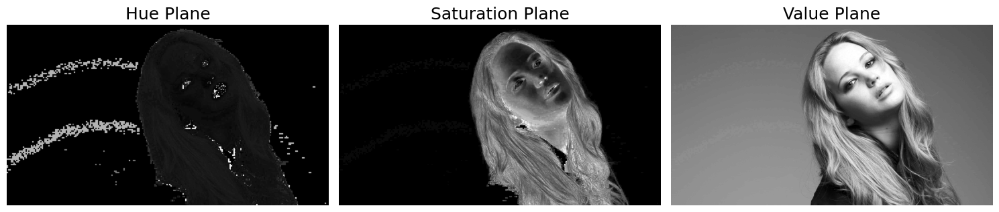

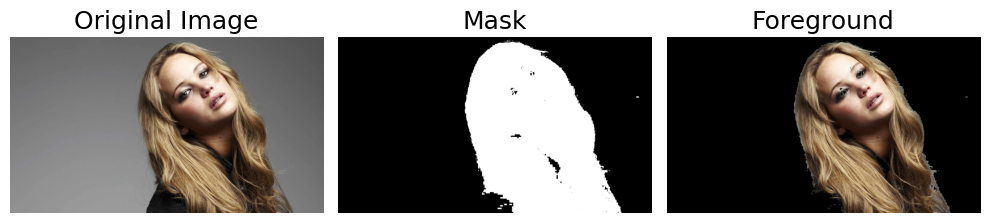

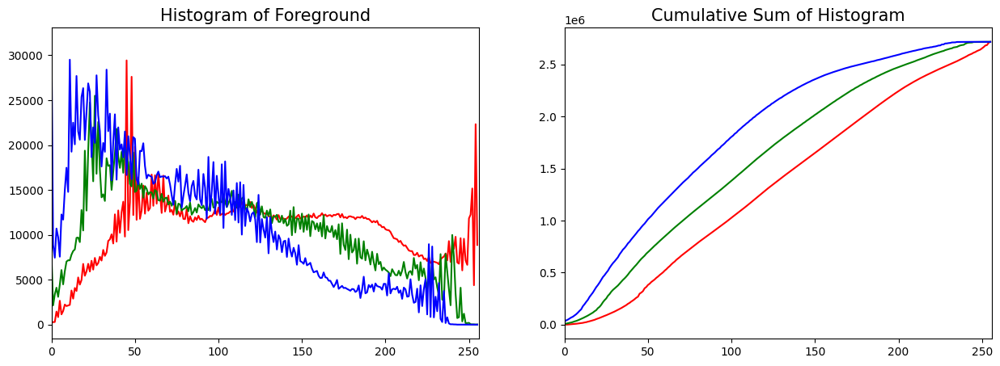

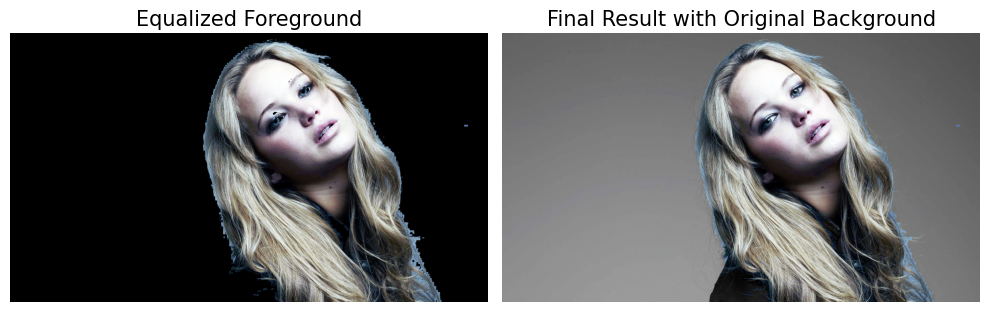

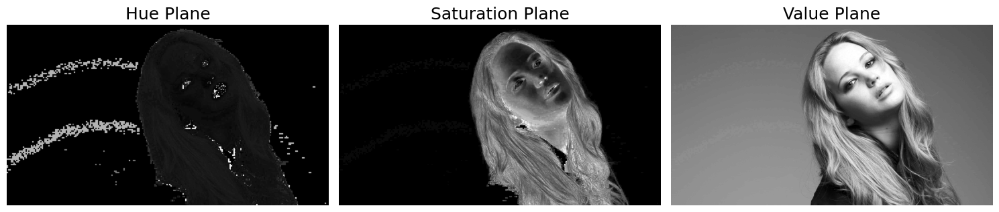

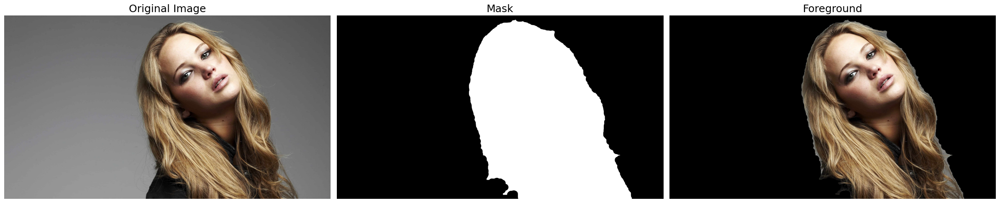

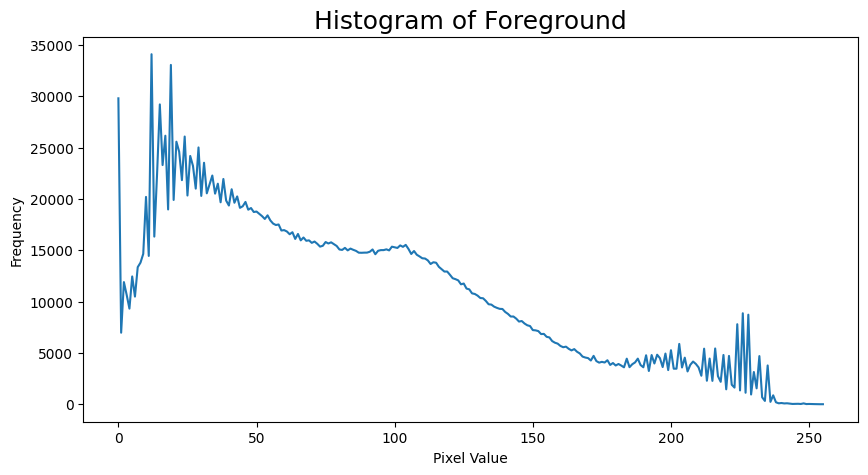

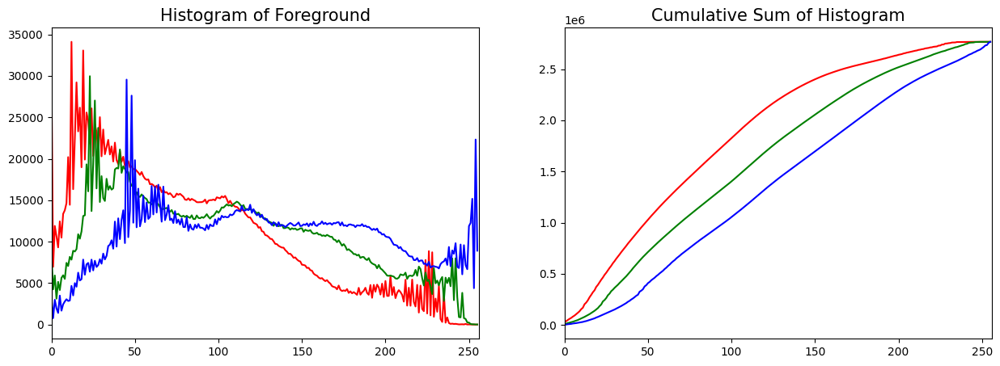

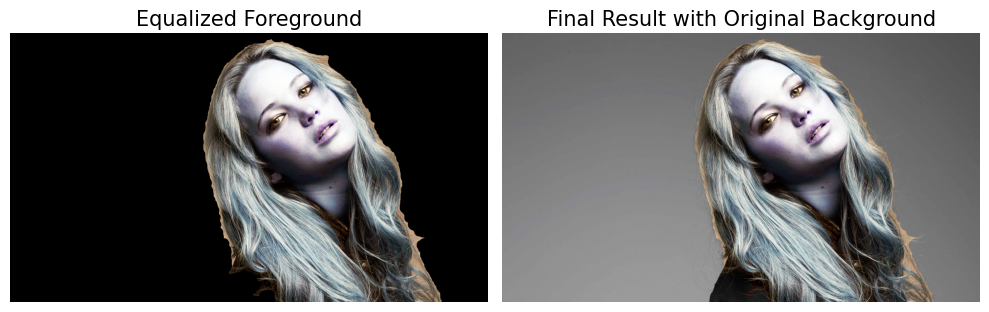

In [ ]:
# (a) Open the image, split it into HSV planes, and display them in grayscale.
img6 = cv.imread("./a1images/jeniffer.jpg", cv.IMREAD_COLOR)
img6_hsv = cv.cvtColor(img6, cv.COLOR_BGR2HSV)
hue_plane = img6_hsv[:, :, 0]
saturation_plane = img6_hsv[:, :, 1]
value_plane = img6_hsv[:, :, 2]

plt.figure(figsize=(15, 10))
plt.rc("axes", titlesize=18)
plt.subplot(131)
plt.imshow(hue_plane, cmap='gray')
plt.title("Hue Plane")
plt.axis('off')
plt.subplot(132)
plt.imshow(saturation_plane, cmap='gray')
plt.title("Saturation Plane")
plt.axis('off')
plt.subplot(133)
plt.imshow(value_plane, cmap='gray')
plt.title("Value Plane")
plt.axis('off')
plt.tight_layout()

# (b) Create the binary mask based on the saturation values to extract the foreground.
saturation_min = 15
saturation_max = 255
foreground_mask = cv.inRange(saturation_plane, saturation_min, saturation_max)

# Apply morphological operations to clean up the mask.
foreground_mask = cv.morphologyEx(foreground_mask, cv.MORPH_CLOSE, cv.getStructuringElement(cv.MORPH_ELLIPSE, (80, 80)))

# (c) Obtain the foreground using cv.bitwise_and.
foreground_rgb = cv.bitwise_and(img6, img6, mask=foreground_mask)

# Display the original image, mask, and foreground.
plt.figure(figsize=(24, 8))
plt.subplot(131)
plt.imshow(cv.cvtColor(img6, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.subplot(132)
plt.imshow(foreground_mask, cmap='gray')
plt.title('Mask')
plt.axis('off')
plt.subplot(133)
plt.imshow(cv.cvtColor(foreground_rgb, cv.COLOR_BGR2RGB))
plt.title('Foreground')
plt.axis('off')
plt.tight_layout()

# (d) Compute the histogram for the foreground.
histogram = cv.calcHist([foreground_rgb], [0], foreground_mask, [256], [0, 256])

# Plot the histogram of the foreground.
plt.figure(figsize=(10, 5))
plt.plot(histogram)
plt.title('Histogram of Foreground')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

# (e) Compute the cumulative sum and apply the transformation to histogram equalize the foreground.
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plt.rc("axes", titlesize=15)

equalized_foreground = foreground_rgb.copy()
colors = ('r', 'g', 'b')

# Loop over color channels and calculate histograms and cumulative sums.
for i, color in enumerate(colors):
    hist = cv.calcHist([foreground_rgb], [i], foreground_mask, [256], [0, 256])
    ax[0].plot(hist, color=color)
    ax[0].set_xlim([0, 256])

    cumulative = np.cumsum(hist)
    ax[1].plot(cumulative, color=color)
    ax[1].set_xlim([0, 256])

    transform = cumulative * 255 / cumulative[-1]
    equalized_foreground[:, :, i] = transform[foreground_rgb[:, :, i]]

# Equalize the foreground and retain the mask to remove background after equalization.
equalized_foreground = np.bitwise_and(equalized_foreground, np.repeat(foreground_mask[:, :, None], 3, axis=2))

ax[0].set_title("Histogram of Foreground")
ax[1].set_title("Cumulative Sum of Histogram")

# (f) Extract the background and combine it with the equalized foreground.
background_mask_3d = 255 - np.repeat(foreground_mask[:, :, None], 3, axis=2)
background_hsv = np.bitwise_and(img6_hsv, background_mask_3d)
background_rgb = cv.cvtColor(background_hsv, cv.COLOR_HSV2RGB)
final_image = background_rgb + equalized_foreground

# Display the final result.
plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(equalized_foreground)
plt.title('Equalized Foreground')
plt.axis('off')
plt.subplot(122)
plt.imshow(final_image)
plt.title('Final Result with Original Background')
plt.axis('off')
plt.tight_layout()

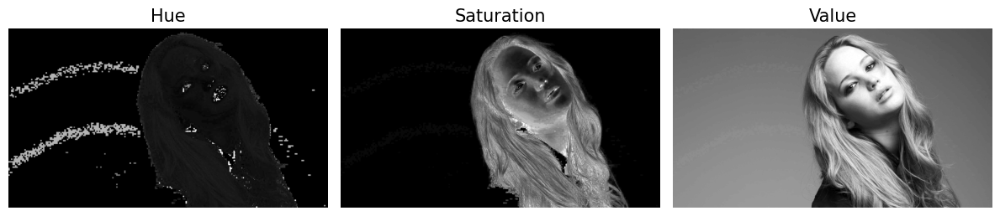

In [ ]:
# Load the image
image = cv.imread('./a1images/jeniffer.jpg')

# Convert the image to HSV
hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)

# Split the HSV image into H, S, and V components
hue, saturation, value = cv.split(hsv_image)

# Display the H, S, V planes in grayscale
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(hue, cmap='gray')
plt.title('Hue')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(saturation, cmap='gray')
plt.title('Saturation')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(value, cmap='gray')
plt.title('Value')
plt.axis('off')

plt.tight_layout()
plt.show()

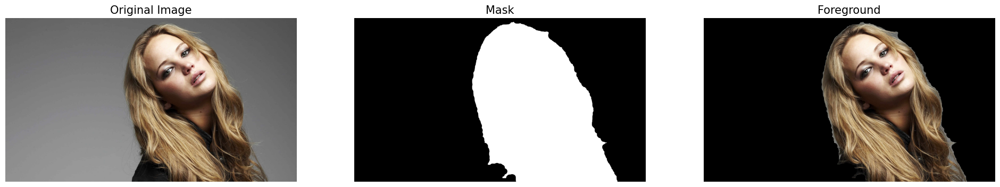

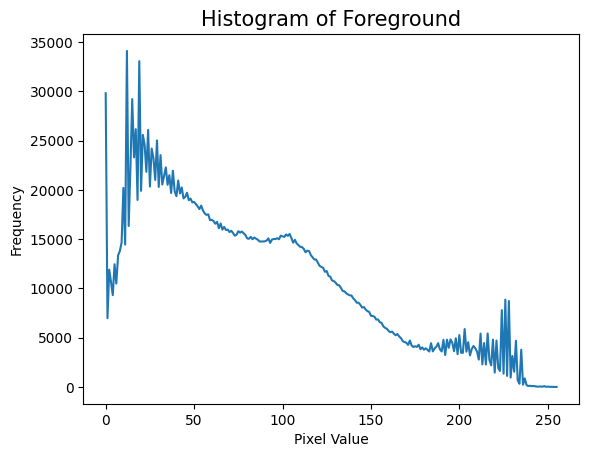

In [ ]:
# Define the threshold values for saturation
saturation_min = 15
saturation_max = 255

# Create a binary mask based on saturation
foreground_mask = cv.inRange(saturation, saturation_min, saturation_max)

# Apply morphological operations to reduce noise
foreground_mask = cv.morphologyEx(foreground_mask, cv.MORPH_CLOSE, cv.getStructuringElement(cv.MORPH_ELLIPSE,(80, 80)))

# Obtain the foreground using cv.bitwise_and
foreground = cv.bitwise_and(image, image, mask=foreground_mask)

# Compute the histogram of the foreground
histogram = cv.calcHist([foreground], [0], foreground_mask, [256], [0, 256])

# Display the original image, mask, and foreground
plt.figure(figsize=(24, 8))

plt.subplot(131), plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB)), plt.title('Original Image'), plt.axis('off')
plt.subplot(132), plt.imshow(foreground_mask, cmap='gray'), plt.title('Mask'), plt.axis('off')
plt.subplot(133), plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB)), plt.title('Foreground'), plt.axis('off')
plt.show()

# Plot the histogram
plt.plot(histogram)
plt.title('Histogram of Foreground')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

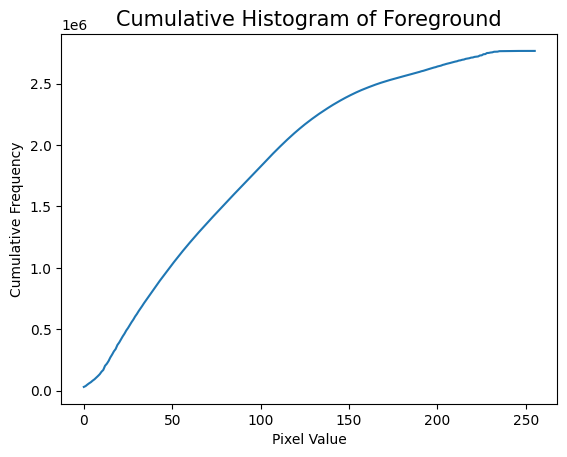

In [ ]:
cumulative_histogram = np.cumsum(histogram)

# Plot the cumulative histogram
plt.plot(cumulative_histogram)
plt.title('Cumulative Histogram of Foreground')
plt.xlabel('Pixel Value')
plt.ylabel('Cumulative Frequency')
plt.show()


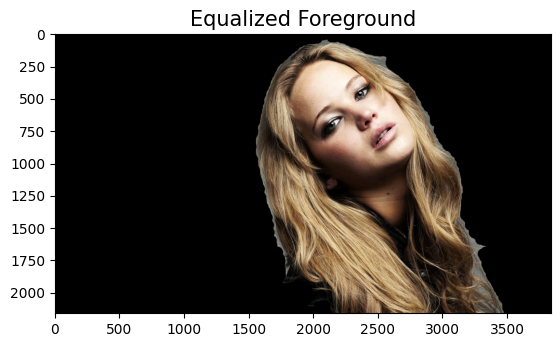

In [ ]:
# Convert to hsv
hsv_foreground = cv.cvtColor(foreground, cv.COLOR_BGR2HSV)
value_foreground = hsv_foreground[:, :, 2]

# Apply histogram equalization
equalized_value_foreground = cv.equalizeHist(value_foreground)

hsv_foreground[:,:,2] = equalized_value_foreground

plt.imshow(cv.cvtColor(hsv_foreground, cv.COLOR_HSV2RGB)), plt.title('Equalized Foreground')
plt.show()

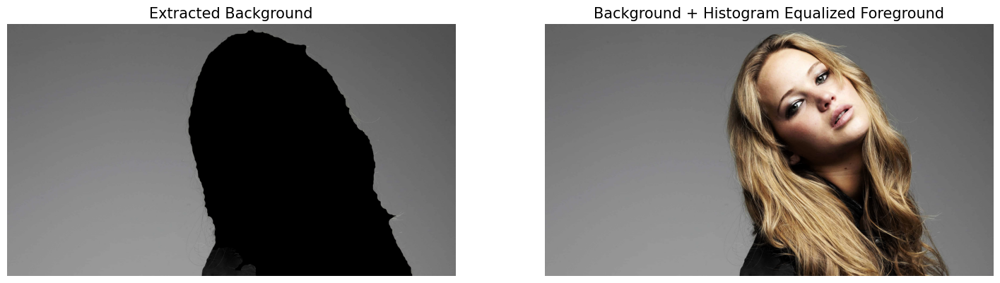

In [ ]:
background_mask = cv.bitwise_not(foreground_mask)

# Obtain the background using cv.bitwise_and
extracted_background = cv.bitwise_and(image, image, mask=background_mask)

# Combine the background and histogram-equalized foreground
result = cv.add(extracted_background, cv.cvtColor(hsv_foreground, cv.COLOR_HSV2BGR))

plt.figure(figsize=(18, 6))

# Display the result
plt.subplot(121),plt.imshow(cv.cvtColor(extracted_background, cv.COLOR_BGR2RGB)),plt.title('Extracted Background'),plt.axis('off')
plt.subplot(122),plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB)),plt.title('Background + Histogram Equalized Foreground'),plt.axis('off')
plt.show()

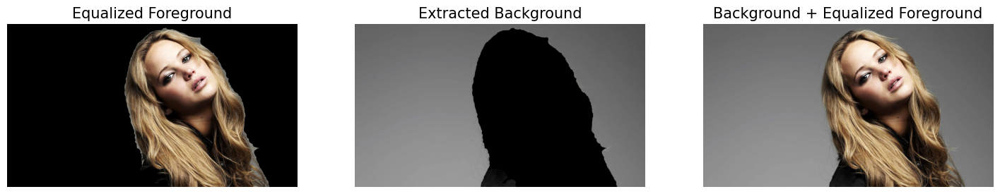

In [ ]:
# Convert the foreground to HSV color space
hsv_foreground = cv.cvtColor(foreground, cv.COLOR_BGR2HSV)

# Extract the value (V) channel for histogram equalization
value_foreground = hsv_foreground[:, :, 2]

# Apply histogram equalization to the value (V) channel
equalized_value_foreground = cv.equalizeHist(value_foreground)

# Update the HSV image with the equalized value channel
hsv_foreground[:, :, 2] = equalized_value_foreground

# Convert the HSV back to RGB for visualization
equalized_foreground_rgb = cv.cvtColor(hsv_foreground, cv.COLOR_HSV2RGB)

# Create a mask for the background by inverting the foreground mask
background_mask = cv.bitwise_not(foreground_mask)

# Extract the background using cv.bitwise_and
extracted_background = cv.bitwise_and(image, image, mask=background_mask)

# Combine the extracted background and histogram-equalized foreground
result = cv.add(extracted_background, cv.cvtColor(hsv_foreground, cv.COLOR_HSV2BGR))

# Display all three images in a horizontal line
plt.figure(figsize=(18, 6))  # Set figure size (18 inches wide, 6 inches tall)

# Display the Equalized Foreground
plt.subplot(1, 3, 1)  # 1 row, 3 columns, first image
plt.imshow(equalized_foreground_rgb)  # Show the equalized foreground
plt.title('Equalized Foreground')  # Set the title
plt.axis('off')  # Turn off axis labels and ticks

# Display the Extracted Background
plt.subplot(1, 3, 2)  # 1 row, 3 columns, second image
plt.imshow(cv.cvtColor(extracted_background, cv.COLOR_BGR2RGB))  # Show the extracted background
plt.title('Extracted Background')  # Set the title
plt.axis('off')  # Turn off axis labels and ticks

# Display the Background + Histogram Equalized Foreground
plt.subplot(1, 3, 3)  # 1 row, 3 columns, third image
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))  # Show the combined result
plt.title('Background + Equalized Foreground')  # Set the title
plt.axis('off')  # Turn off axis labels and ticks

# Display the figure
plt.show()


**Discussion:** The saturation plane was chosen for 
thresholding since the foreground is more saturated than 
the background. After thresholding with cv.inRange(), 
morphological operations were used to clean the mask 
and capture darker foreground details like the eyes. 
Histogram equalization was applied to enhance contrast 
in the value plane, and the foreground was combined with 
the original background to produce the final result.

# Question 7 – Sobel filtering the photo of Albert Einstein

(a) Using filter2D:This step applies the vertical and horizontal Sobel filters using cv.filter2D() with predefined Sobel kernels. The gradient 
magnitude is computed using both horizontal and vertical gradients.


(b) Manual Application:A manual convolution is performed by sliding a 3x3 Sobel kernel over the image and calculating the sum of pixel 
intensities for both vertical and horizontal directions.


(c) Using sepFilter2D:The separable Sobel filter is applied using cv.sepFilter2D() which decomposes the Sobel filter into two 1D filters 
and applies them along the rows and columns.

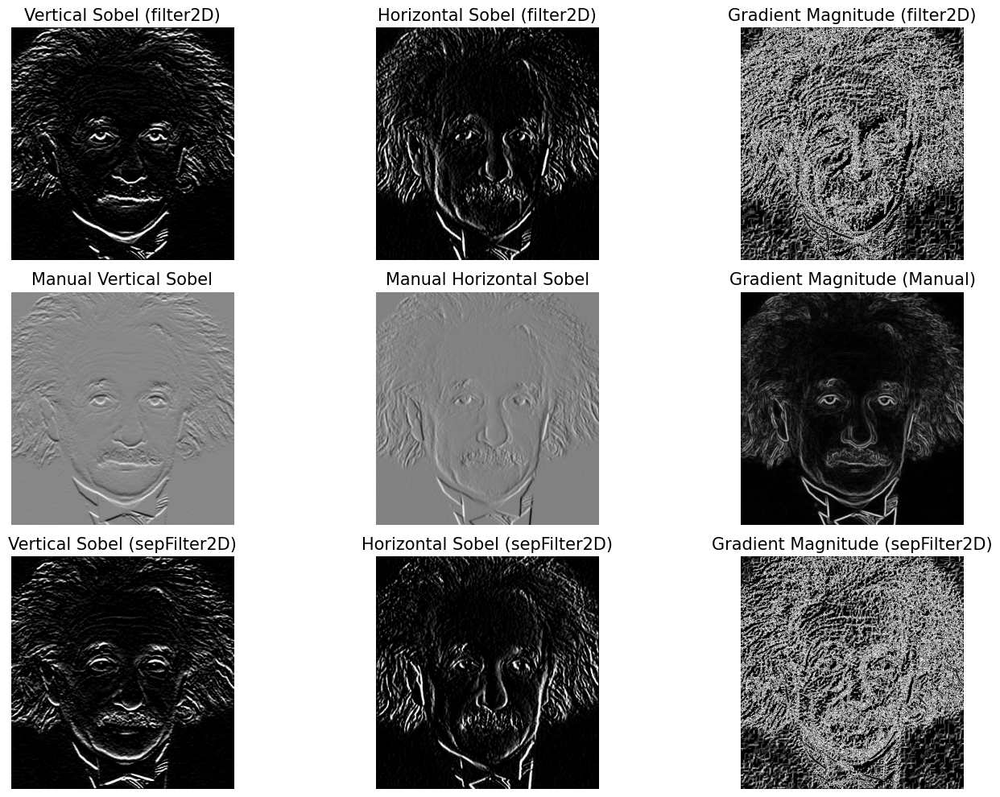

In [57]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
img = cv.imread('./a1images/einstein.png', cv.IMREAD_GRAYSCALE)

# (a) Using filter2D to apply Sobel filter
sobel_v = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype='float32')  # Vertical Sobel kernel
sobel_h = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype='float32')  # Horizontal Sobel kernel

imv = cv.filter2D(img, -1, sobel_v)  # Apply vertical Sobel
imh = cv.filter2D(img, -1, sobel_h)  # Apply horizontal Sobel
grad_mag = np.sqrt(imv**2 + imh**2)  # Compute gradient magnitude

# (b) Manually applying the Sobel filter
rows, cols = img.shape
kernel_size = 3
imv_manual = np.zeros((rows - kernel_size + 1, cols - kernel_size + 1), dtype='float32')
imh_manual = np.zeros((rows - kernel_size + 1, cols - kernel_size + 1), dtype='float32')

for row in range(rows - kernel_size + 1):
    for col in range(cols - kernel_size + 1):
        imv_manual[row, col] = np.sum(img[row:row + kernel_size, col:col + kernel_size] * sobel_v)
        imh_manual[row, col] = np.sum(img[row:row + kernel_size, col:col + kernel_size] * sobel_h)

grad_mag_manual = np.sqrt(imv_manual**2 + imh_manual**2)  # Compute gradient magnitude

# (c) Using sepFilter2D for Sobel filtering
sobel_h_kernel = np.array([1, 2, 1], dtype=np.float32)
sobel_v_kernel = np.array([1, 0, -1], dtype=np.float32)

im1 = cv.sepFilter2D(img, -1, sobel_h_kernel, sobel_v_kernel)  # Separable Sobel filtering (vertical)
im2 = cv.sepFilter2D(img, -1, sobel_v_kernel, sobel_h_kernel)  # Separable Sobel filtering (horizontal)
grad_mag_sep = np.sqrt(im1**2 + im2**2)  # Compute gradient magnitude

# Display results in a 3x3 grid
plt.figure(figsize=(15, 10))

# (a) filter2D results
plt.subplot(3, 3, 1), plt.imshow(imv, cmap='gray'), plt.title('Vertical Sobel (filter2D)'), plt.axis('off')
plt.subplot(3, 3, 2), plt.imshow(imh, cmap='gray'), plt.title('Horizontal Sobel (filter2D)'), plt.axis('off')
plt.subplot(3, 3, 3), plt.imshow(grad_mag, cmap='gray'), plt.title('Gradient Magnitude (filter2D)'), plt.axis('off')

# (b) Manual Sobel results
plt.subplot(3, 3, 4), plt.imshow(imv_manual, cmap='gray'), plt.title('Manual Vertical Sobel'), plt.axis('off')
plt.subplot(3, 3, 5), plt.imshow(imh_manual, cmap='gray'), plt.title('Manual Horizontal Sobel'), plt.axis('off')
plt.subplot(3, 3, 6), plt.imshow(grad_mag_manual, cmap='gray'), plt.title('Gradient Magnitude (Manual)'), plt.axis('off')

# (c) sepFilter2D results
plt.subplot(3, 3, 7), plt.imshow(im1, cmap='gray'), plt.title('Vertical Sobel (sepFilter2D)'), plt.axis('off')
plt.subplot(3, 3, 8), plt.imshow(im2, cmap='gray'), plt.title('Horizontal Sobel (sepFilter2D)'), plt.axis('off')
plt.subplot(3, 3, 9), plt.imshow(grad_mag_sep, cmap='gray'), plt.title('Gradient Magnitude (sepFilter2D)'), plt.axis('off')

plt.tight_layout()
plt.show()


**Discussion:** All methods yield similar results. The Sobel vertical 
filter emphasizes vertical edges, detecting intensity 
changes from top to bottom, while the horizontal 
filter emphasizes horizontal edges. Combining both 
gradients provides the overall gradient magnitude at 
each pixel. The output image dimensions are 
reduced by the kernel size during convolution.

# Question 8 – Zooming an image with nearest-neighbor and bilinear interpolation

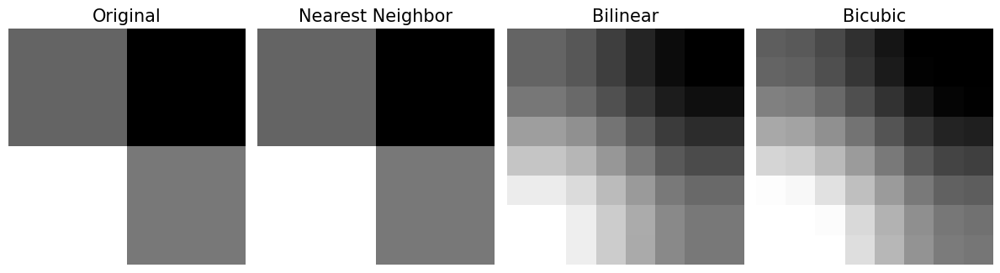

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Original 2x2 grayscale image
test_img = np.array([[100, 0], [255, 120]], dtype=np.uint8)

# Define the scale factor for super resolution
scale_factor = 4

# Compute new size (scale up by a factor of 5)
new_size = (test_img.shape[1] * scale_factor, test_img.shape[0] * scale_factor)

# Apply different interpolation methods
nearest_img = cv2.resize(test_img, new_size, interpolation=cv2.INTER_NEAREST)
bilinear_img = cv2.resize(test_img, new_size, interpolation=cv2.INTER_LINEAR)
bicubic_img = cv2.resize(test_img, new_size, interpolation=cv2.INTER_CUBIC)

# Display the images
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.title('Original')
plt.imshow(test_img, cmap='gray', vmin=0, vmax=255)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title('Nearest Neighbor')
plt.imshow(nearest_img, cmap='gray', vmin=0, vmax=255)
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title('Bilinear')
plt.imshow(bilinear_img, cmap='gray', vmin=0, vmax=255)
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title('Bicubic')
plt.imshow(bicubic_img, cmap='gray', vmin=0, vmax=255)
plt.axis('off')

plt.tight_layout()
plt.show()


### 1. **Nearest-Neighbor Interpolation**:
Nearest-neighbor interpolation simply assigns the value of the closest pixel to the new location. The mathematical representation is:

$$
I(x', y') = I(\text{round}(x), \text{round}(y))
$$

Where:
- \( I(x', y') \) is the interpolated intensity at the new coordinates \( (x', y') \).
- \( I(x, y) \) is the intensity at the original coordinates.
- \( \text{round}(x), \text{round}(y) \) are the nearest pixel coordinates in the original image.

### 2. **Bilinear Interpolation**:
Bilinear interpolation performs linear interpolation in two directions (x and y). The formula for the interpolated value is:

$$
I(x', y') = (1 - \Delta x)(1 - \Delta y)I(x_1, y_1) + \Delta x(1 - \Delta y)I(x_2, y_1) + (1 - \Delta x)\Delta y I(x_1, y_2) + \Delta x \Delta y I(x_2, y_2)
$$

Where:
- \( \Delta x = x' - x_1 \) and \( \Delta y = y' - y_1 \) are the fractional parts of the coordinates.
- \( (x_1, y_1) \), \( (x_2, y_1) \), \( (x_1, y_2) \), and \( (x_2, y_2) \) are the four neighboring pixels around the point \( (x', y') \).

### 3. **Bicubic Interpolation**:
Bicubic interpolation uses cubic polynomials to interpolate pixel values. The general form for cubic interpolation is:

\[
I(x', y') = \sum_{i=0}^{3} \sum_{j=0}^{3} w(i, j) \cdot I(x + i - 1, y + j - 1)
\]

Where:
- \( w(i, j) \) are the weights determined by the cubic convolution function, typically defined as:
\[
w(t) = \begin{cases}
    (a + 2)|t|^3 - (a + 3)|t|^2 + 1 & \text{if} \ |t| \leq 1 \\
    a|t|^3 - 5a|t|^2 + 8a|t| - 4a & \text{if} \ 1 < |t| \leq 2 \\
    0 & \text{if} \ |t| > 2
\end{cases}
\]
Where \( a \) is typically set to -0.5 (for Catmull-Rom spline).

### Summary of Equations:
1. **Nearest Neighbor**:
   $$
   I(x', y') = I(\text{round}(x), \text{round}(y))
   $$
2. **Bilinear**:
   $$
   I(x', y') = (1 - \Delta x)(1 - \Delta y)I(x_1, y_1) + \Delta x(1 - \Delta y)I(x_2, y_1) + (1 - \Delta x)\Delta y I(x_1, y_2) + \Delta x \Delta y I(x_2, y_2)
   $$
3. **Bicubic**:
   $$
   I(x', y') = \sum_{i=0}^{3} \sum_{j=0}^{3} w(i, j) \cdot I(x + i - 1, y + j - 1)
   $$



In [54]:
# Import required libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Function to zoom the image
def zoom_image(image, scale, interpolation):
    height, width = image.shape[:2]
    new_size = (int(width * scale), int(height * scale))
    return cv2.resize(image, new_size, interpolation=interpolation)

# Function to compute normalized SSD between two images
def compute_normalized_ssd(img1, img2, bypass_size_error=True):
    if not bypass_size_error:
        # Ensure images are of the same size
        assert img1.shape == img2.shape, "Images must be the same shape for SSD computation."
    else: 
        # Crop the larger image to match the smaller image
        min_height = min(img1.shape[0], img2.shape[0])
        min_width = min(img1.shape[1], img2.shape[1])

        img1 = img1[:min_height, :min_width]
        img2 = img2[:min_height, :min_width]

    
    
    # Compute the sum of squared differences
    ssd = np.sum((img1.astype("float32") - img2.astype("float32")) ** 2)
    
    # Normalize by the number of pixels
    norm_ssd = ssd / np.prod(img1.shape)
    
    return norm_ssd

# Function to display images side-by-side
def display_images(original, nearest, bilinear, titles):
    plt.figure(figsize=(15, 15))

    # Original image
    plt.subplot(3, 1, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title(titles[0])
    plt.axis('off')

    # Nearest-neighbor zoomed image
    plt.subplot(3, 1, 2)
    plt.imshow(cv2.cvtColor(nearest, cv2.COLOR_BGR2RGB))
    plt.title(titles[1])
    plt.axis('off')

    # Bilinear zoomed image
    plt.subplot(3,1, 3)
    plt.imshow(cv2.cvtColor(bilinear, cv2.COLOR_BGR2RGB))
    plt.title(titles[2])
    plt.axis('off')

    plt.show()


def get_zoom_and_orignal_img(small_img, big_img, scale_factor=4, bypass_size_error=True):
        # Scale factor
    scale_factor = 4

    # Zoom using nearest-neighbor interpolation
    zoomed_nn = zoom_image(small_img, scale_factor, cv2.INTER_NEAREST)

    # Zoom using bilinear interpolation
    zoomed_bilinear = zoom_image(small_img, scale_factor, cv2.INTER_LINEAR)

    # Compute normalized SSD for nearest-neighbor zoomed image
    ssd_nn = compute_normalized_ssd(big_img, zoomed_nn, bypass_size_error=bypass_size_error)

    # Compute normalized SSD for bilinear zoomed image
    ssd_bilinear = compute_normalized_ssd(big_img, zoomed_bilinear, bypass_size_error=bypass_size_error)

    # Print out SSD values
    print(f"Normalized SSD (Nearest Neighbor): {ssd_nn}")
    print(f"Normalized SSD (Bilinear): {ssd_bilinear}")

    # Display the images
    titles = ["Original taylor_small", f"Nearest N. Zoomed taylor_very_small, ssd={ssd_nn}", f"Bilinear Zoomed taylor_very_small, ssd={ssd_bilinear}"]
    display_images(big_img, zoomed_nn, zoomed_bilinear, titles)


In [55]:
im01_small_img = cv2.imread("./a1images/a1q5images/im01small.png")
im01_img = cv2.imread("./a1images/a1q5images/im01.png")

im02_small_img = cv2.imread("./a1images/a1q5images/im02small.png")
im02_img = cv2.imread("./a1images/a1q5images/im02.png")

im03_small_img = cv2.imread("./a1images/a1q5images/im03small.png")
im03_img = cv2.imread("./a1images/a1q5images/im03.png")

taylor_very_small_img = cv2.imread("./a1images/a1q5images/taylor_very_small.jpg")
taylor_small_img = cv2.imread("./a1images/a1q5images/taylor_small.jpg")
taylor_img = cv2.imread("./a1images/a1q5images/taylor.jpg")

Normalized SSD (Nearest Neighbor): 228.6223363095238
Normalized SSD (Bilinear): 197.40949404761903


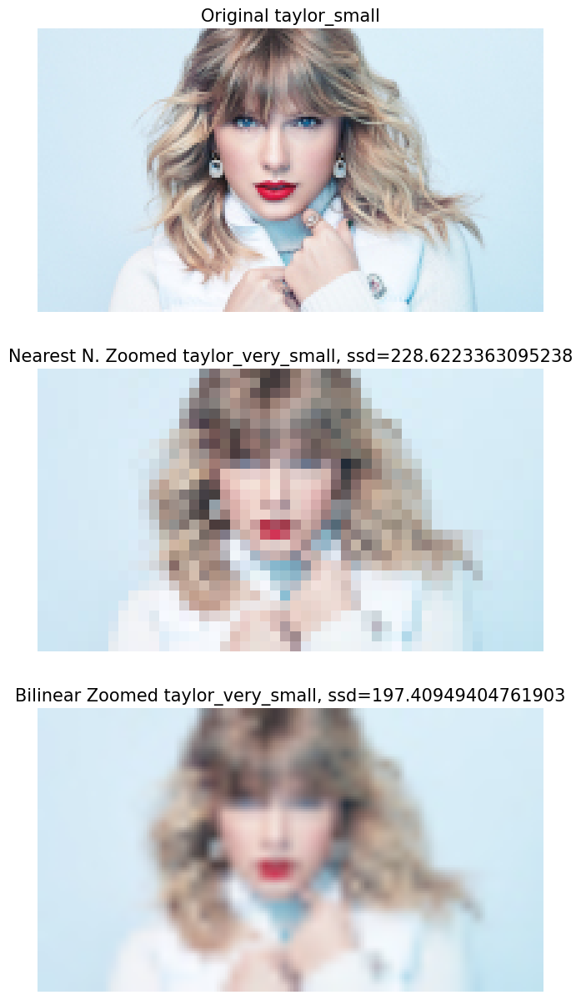

In [56]:
get_zoom_and_orignal_img(small_img=taylor_very_small_img, big_img=taylor_small_img, scale_factor=4, bypass_size_error=False)

1] Nearest-Neighbor Interpolation: Each pixel in the zoomed image is assigned the 
value of the nearest pixel from the original image.

2] Bilinear Interpolation: Uses linear interpolation in both x and y directions, resulting 
in smoother but slightly blurred images.

3] SSD Calculation: The compute_ssd() function computes the normalized sum of 
squared differences between the zoomed image and the original large image after 
resizing.


**Discussion:** Bilinear interpolation offers smoother results 
compared to nearest-neighbor, which can cause blocky 
artifacts. However, some blurring may still occur. Normalized 
SSD helps compare the resized image with the original, but 
results may still show noise and artifacts despite size 
adjustments.


# Question 9 – Segmentation of a Yellow Daisy

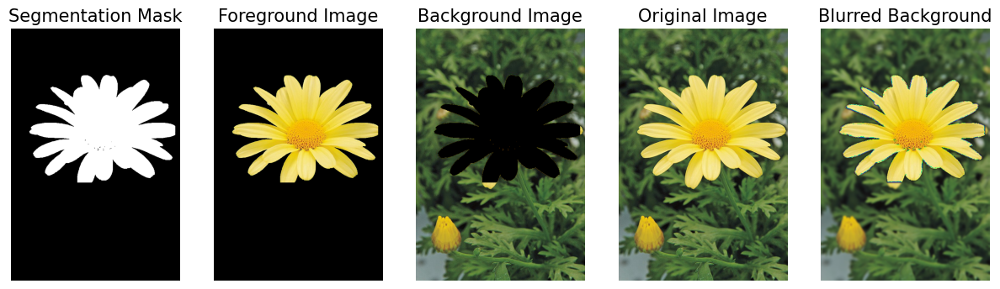

In [ ]:
# (a) Load the image and apply GrabCut to segment it into foreground and background.
img = cv.imread("./a1images/daisy.jpg")

# Initialize mask and models for GrabCut
mask = np.zeros(img.shape[:2], np.uint8)
background_model = np.zeros((1, 65), np.float64)
foreground_model = np.zeros((1, 65), np.float64)
rectangle = (40, 10, 505, 505)

# Perform GrabCut with an initial rectangle around the object
cv.grabCut(img, mask, rectangle, background_model, foreground_model, 5, cv.GC_INIT_WITH_RECT)

# Create the segmentation mask for the foreground
mask1 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
img1 = img * mask1[:, :, np.newaxis]

# Create the segmentation mask for the background
cv.grabCut(img, mask, rectangle, background_model, foreground_model, 5, cv.GC_INIT_WITH_RECT)
mask2 = np.where((mask == 3) | (mask == 1), 0, 1).astype('uint8')
img2 = img * mask2[:, :, np.newaxis]

# (b) Blur the background image and combine it with the segmented foreground to create an enhanced image
blurred_img = img1 + cv.GaussianBlur(img2, (15, 15), 0)

# (c) Display the final segmentation mask, the foreground, background, original image, and the enhanced image
fig, ax = plt.subplots(1, 5, figsize=(15, 15))

# Show the segmentation mask
ax[0].imshow(mask1, cmap='gray')
ax[0].set_title("Segmentation Mask")
ax[0].axis("off")

# Show the segmented foreground image
ax[1].imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
ax[1].set_title("Foreground Image")
ax[1].axis("off")

# Show the segmented background image
ax[2].imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))
ax[2].set_title("Background Image")
ax[2].axis("off")

# Show the original image for reference
ax[3].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[3].set_title("Original Image")
ax[3].axis("off")

# Show the enhanced image with blurred background
ax[4].imshow(cv.cvtColor(blurred_img, cv.COLOR_BGR2RGB))
ax[4].set_title("Blurred Background")
ax[4].axis("off")

# Show all plots
plt.show()

**Dark Edge Explanation:** The dark edge in the enhanced image occurs because background pixels 
near the boundary, especially those inaccurately segmented, mix with black pixels (masked) during 
Gaussian blurring, creating a dark halo around the flower